In [63]:
import rasterio
import geopandas as gpd
import numpy as np
from matplotlib import pyplot as plt
from rasterio import mask
from earthpy.spatial import stack as es_stack
from earthpy.spatial import crop_image
from earthpy.spatial import bytescale
from glob import glob
from scipy.stats import linregress
from skimage.measure import block_reduce, regionprops
from skimage.segmentation import slic, mark_boundaries


import warnings
warnings.filterwarnings("ignore")

import matplotlib
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}	
matplotlib.rc('font', **font)

SMALL_SIZE = 16
MEDIUM_SIZE = 18
BIGGER_SIZE = 20

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=MEDIUM_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

In [2]:
# read in the AOI to crop the center of the image
aoi = gpd.read_file('../arcgis_pro/goldhill/sample_aoi.shp')

aoi.crs

{'init': 'epsg:32613'}

In [3]:
# read in the UAV image
ms_drone_im = '../arcgis_pro/goldhill/redo_MS_goldhill_switzerl.tif'
with rasterio.open(ms_drone_im) as src:
    
    ms_full_prof = src.profile
    ms_arr, ms_prof = mask.mask(src, shapes=aoi['geometry'], crop=True, all_touched=True, nodata=ms_full_prof['nodata'])
    
    ms_arr = np.ma.masked_equal(ms_arr, ms_full_prof['nodata'])
    # mask nodata

In [4]:
ms_full_prof['transform']

Affine(0.035247651661553935, 0.0, 461120.79504111357,
       0.0, -0.03524813528867955, 4433336.16202332)

In [60]:
# segment image with SLIC
seg_im = np.rollaxis(ms_arr[[4,2,1]], 0, 3) # Use the NIR-Red-Green bands
seg_im = bytescale(seg_im, cmax=0.4) # increase the contrast for the segmentation
slic_seg = slic(seg_im, multichannel=True, n_segments=5000, compactness=20)


In [147]:
slic_seg.shape, seg_im.shape

((5212, 4767), (5212, 4767, 3))

Text(0.5, 1.0, 'SLIC zoom in')

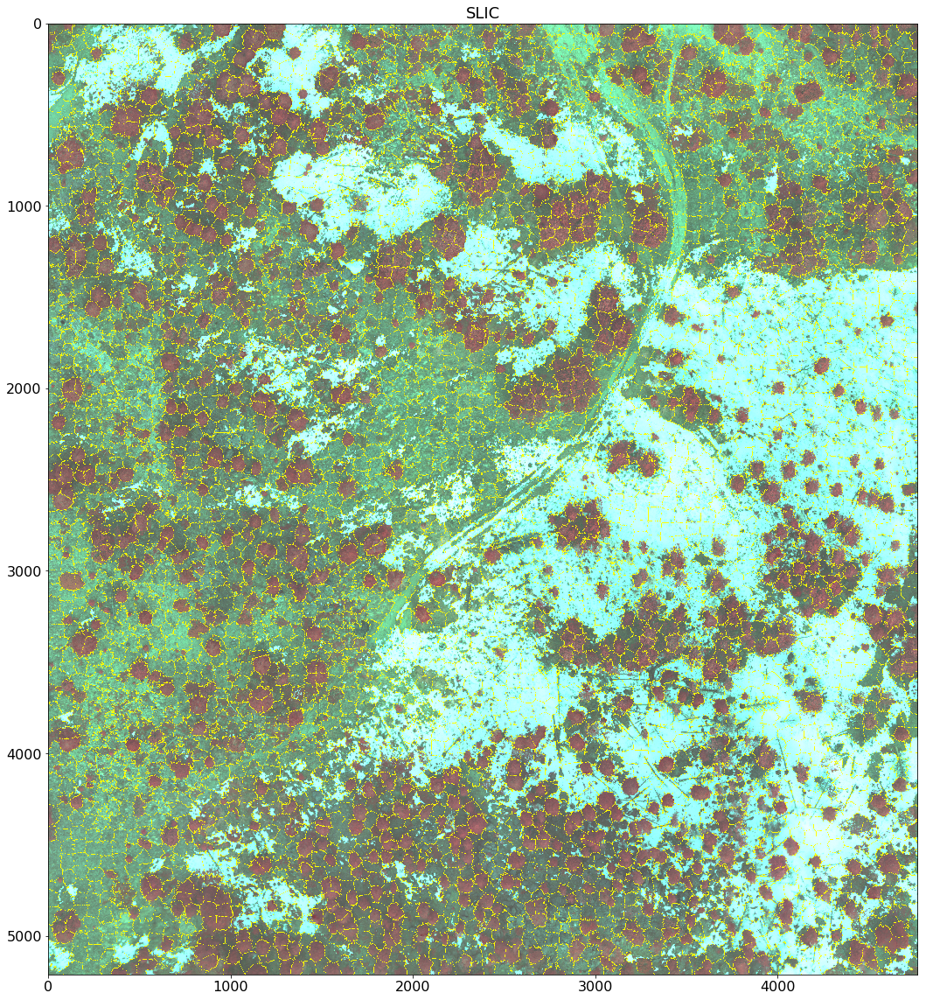

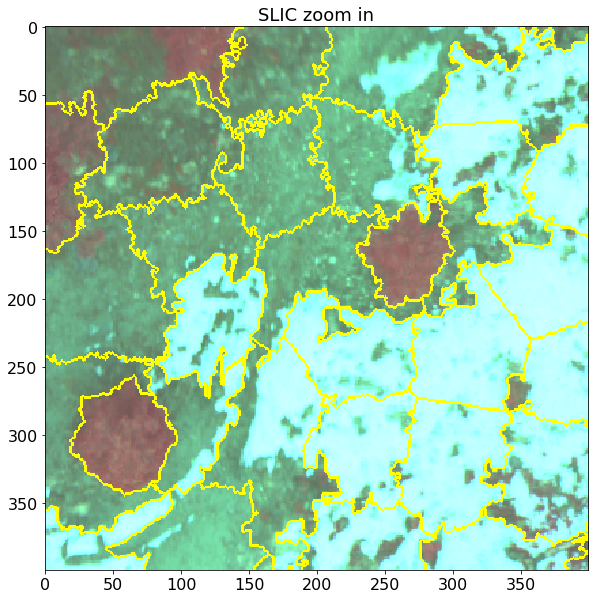

In [148]:
# overlay the segments onto the image
plt.figure(figsize=(20,20))
plt.imshow(seg_im)
plt.imshow(mark_boundaries(seg_im, slic_seg, color=(1,1,0), mode='thick'))
plt.title('SLIC')

# and then zoom in
plt.figure(figsize=(10,10))
prange=400
plt.imshow(seg_im[:prange, :prange, :])
plt.imshow(mark_boundaries(seg_im[:prange, :prange, :], slic_seg[:prange, :prange], color=(1,1,0), mode='thick'))
plt.title('SLIC zoom in')

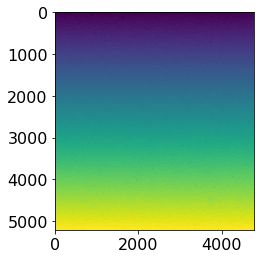

In [67]:
# this is what the segmentation 'image' looks like... each segment has its own label.
plt.imshow(slic_seg)
plt.show()

In [83]:
# hard way to get the mean values of a single band, band 0 in this case (blue)
mean_arr = np.zeros_like(slic_seg).astype('float')
for v in np.unique(slic_seg):
    r,c = np.where(slic_seg==v)
    val = ms_arr[0,r,c].mean()
    mean_arr[r,c] = val

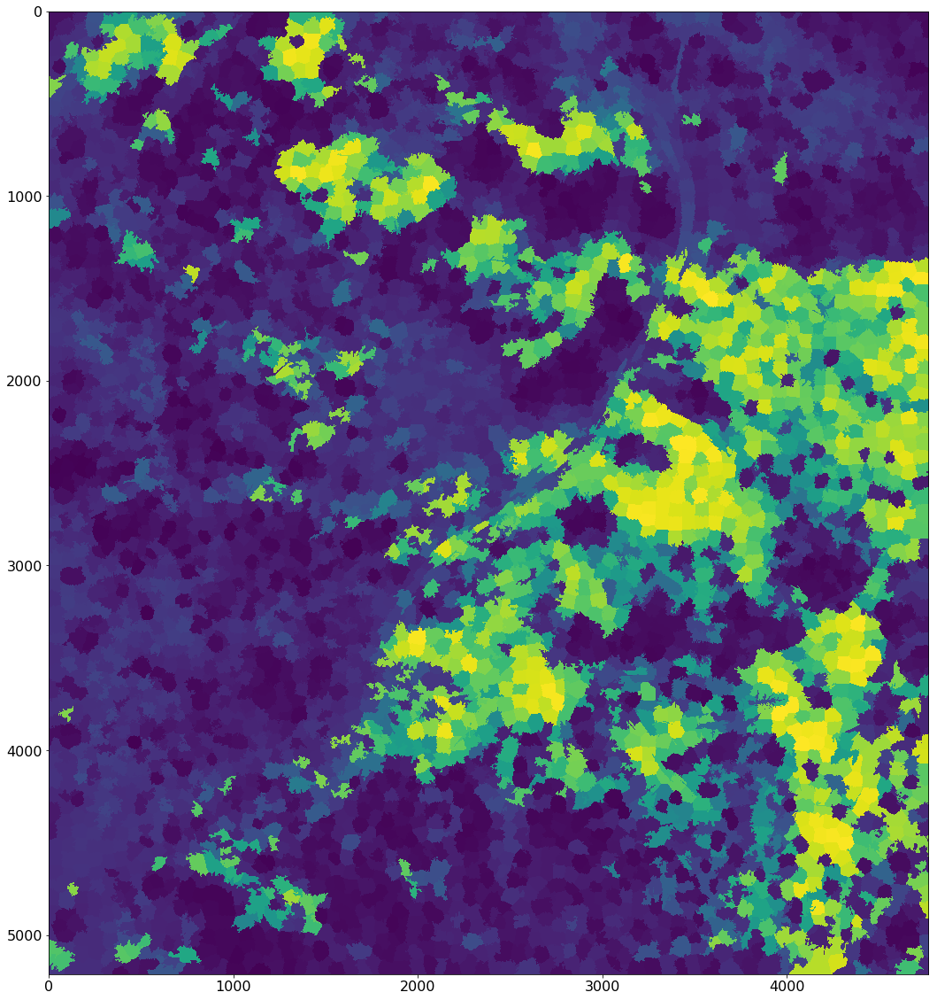

In [84]:
# this is what the mean of band 0 (blue) in each segment looks like
plt.figure(figsize=(20,20))
plt.imshow(mean_arr)
plt.show()

In [87]:
# going to use region props instead
slic_seg+=1 # regionprops doesn't work with 0 index.


In [89]:
# calculate the region properties per segment using list comprehension
# I specify :-1 to use all but the last band of my images, since that is an alpha channel.
bprops = [regionprops(label_image=slic_seg, intensity_image=band.astype('float')) for band in ms_arr[:-1]]

In [93]:
# this shows that the length of one of the band's segment properties 
# is the same number of segments (unique values of segment array)
len(bprops[1]), np.unique(slic_seg).shape

(4371, (4371,))

In [95]:
# this gets the mean value for the blue band (index 0)
b0mean = [s.mean_intensity for s in bprops[0]]

In [96]:
# create that blue mean array again
mean_arr2 = np.zeros_like(slic_seg).astype('float')
for v in np.unique(slic_seg):
    r,c = np.where(slic_seg==v)
    mean_arr2[r,c] = b0mean[v-1]

In [98]:
# they are mostly the same... like 1. e-10 the same
(mean_arr - mean_arr2).mean()

5.858319706452787e-10

In [101]:
# assemple the properties for the 5 bands
bprops = [regionprops(label_image=slic_seg, intensity_image=band.astype('float')) for band in ms_arr[:-1]]

In [130]:
# reconstruct into a feature vector 
prop_arr0 = np.array([[s.mean_intensity] for s in bprops[0]])
prop_arr1 = np.array([[s.mean_intensity] for s in bprops[1]])
prop_arr2 = np.array([[s.mean_intensity] for s in bprops[2]])
prop_arr3 = np.array([[s.mean_intensity] for s in bprops[3]])
prop_arr4 = np.array([[s.mean_intensity, s.eccentricity] for s in bprops[4]])

# stack them into a larger numpy array
prop_arr = np.hstack((prop_arr0, prop_arr1, prop_arr2, prop_arr3, prop_arr4))
# prop_arr.shape # checks the shape

# use ndvi only
ndvi = (prop_arr[:,4] - prop_arr[:,2]) / (prop_arr[:,4] + prop_arr[:,2]) 
ndvi = ndvi[..., np.newaxis]

# this property array has NDVI and eccentricity as a feature...
prop_arr_ndvi = np.hstack((ndvi, prop_arr[:,-1][..., np.newaxis]))
prop_arr_ndvi.shape

(4371, 2)

Use KMeans clustering on the image segments using only NDVI

In [114]:
from sklearn.cluster import KMeans

In [132]:
# arbitrarily specifying 4 clusters
kmeans = KMeans(n_clusters=4, random_state=0)
klabels = kmeans.fit_predict(ndvi)
klabels+=1 # add 1 to have class labels starting at 1 and not 0

In [133]:
# create an image array to assign the class labels per segment
k_arr = np.zeros_like(slic_seg).astype('float')
for v in np.unique(slic_seg):
    r,c = np.where(slic_seg==v)
    k_arr[r,c] = klabels[v-1]

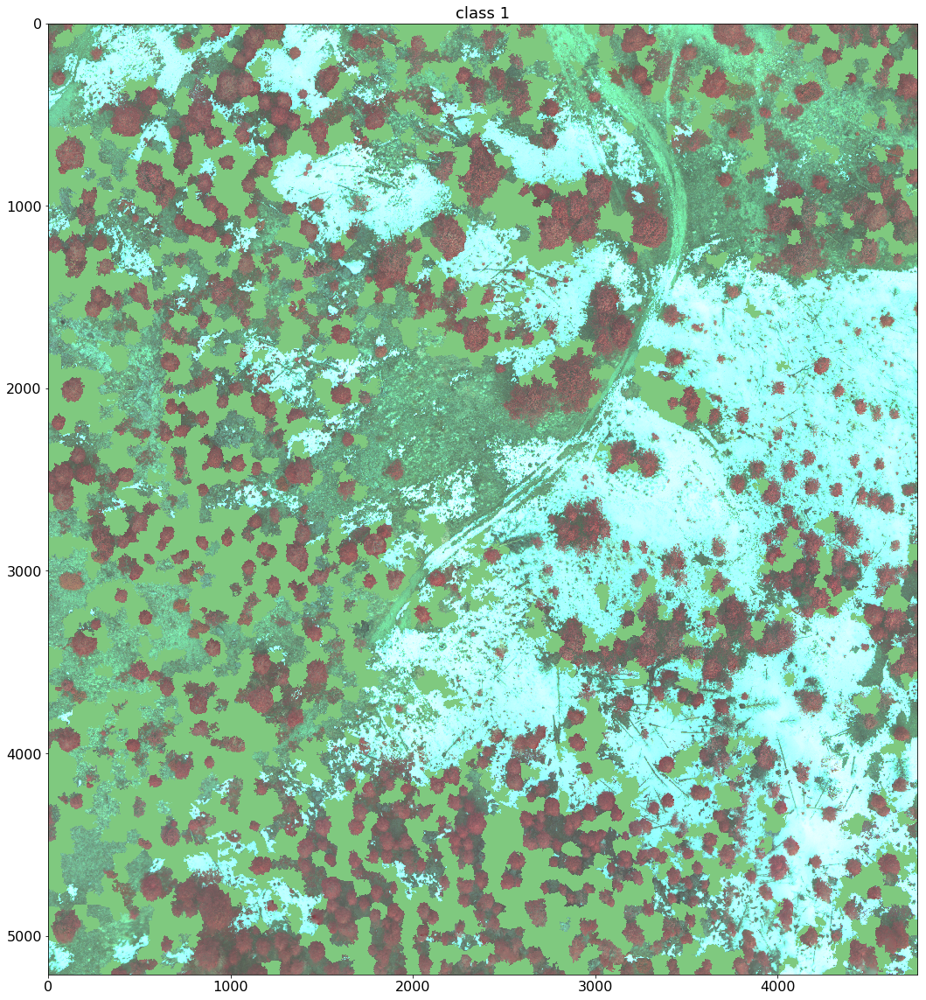

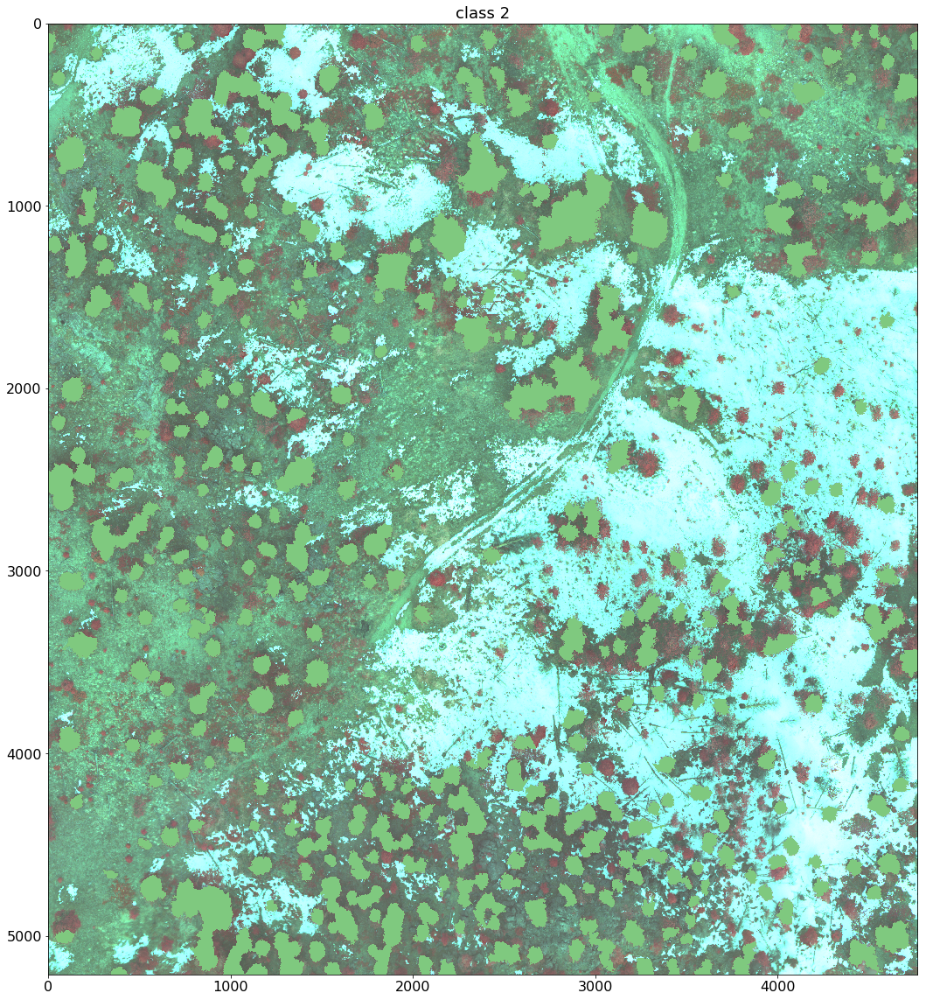

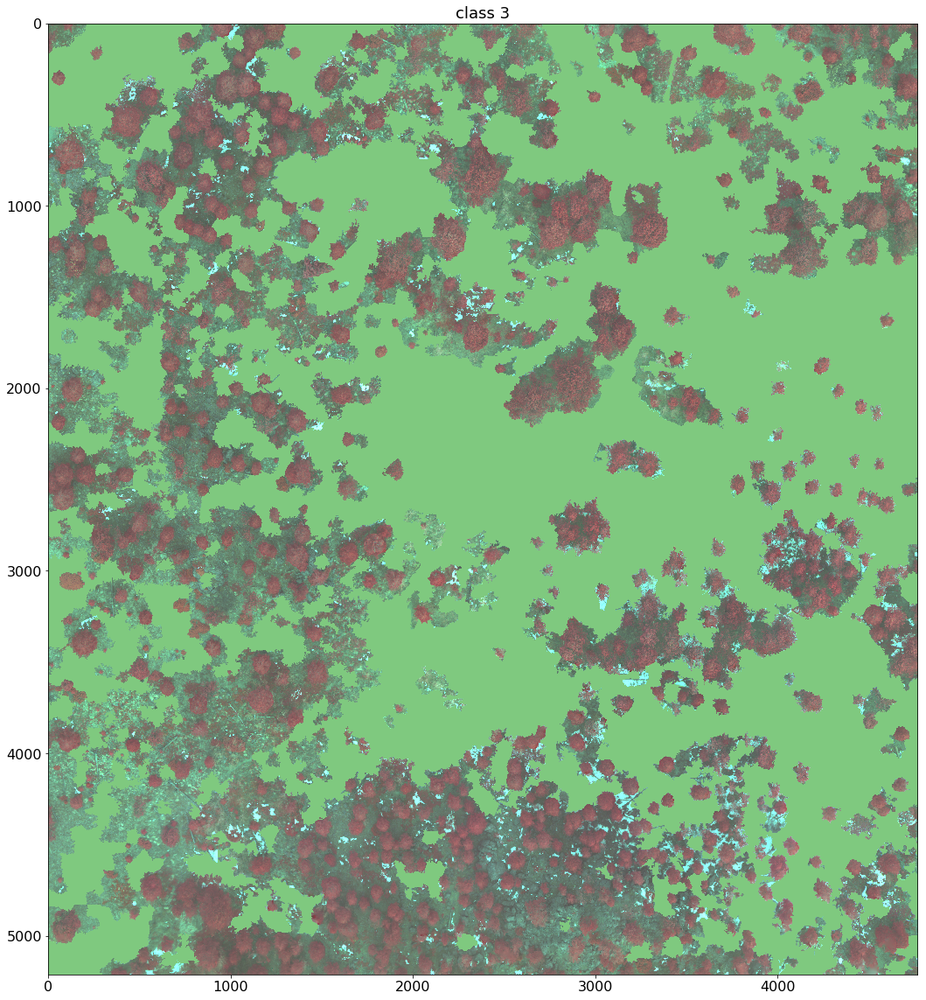

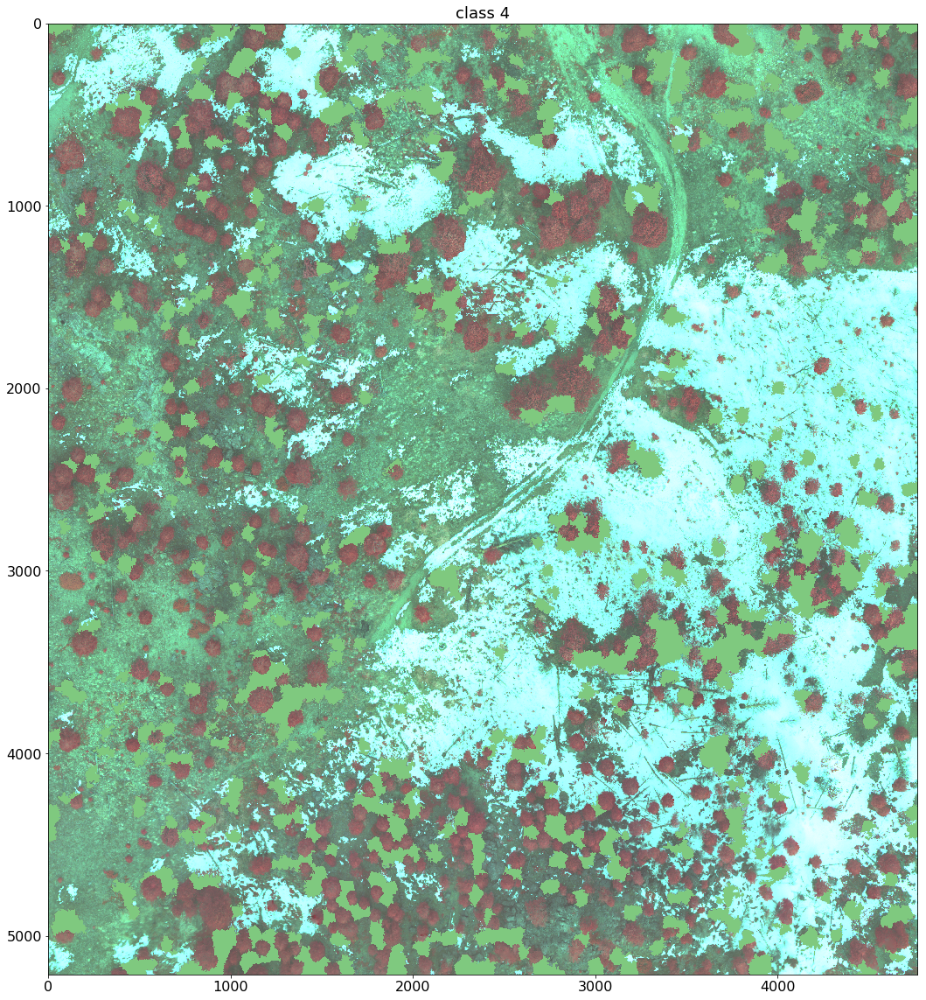

In [146]:
# display the classes individually mapped over the input image
for v in np.unique(k_arr):
    plt.figure(figsize=(20,20))
    plt.imshow(seg_im)
    plt.imshow(np.where(k_arr==v, k_arr, np.nan), cmap='Accent', vmin=v)
    plt.title(f'class {int(v)}')
    plt.show()